**V3: 使用eigenmode source生成不同幅值的平面波，然后再利用同一厚度等效折射率的GRIN透镜对平面波进行发散，获得远场强度分布**

In [59]:
import math
import os
import sys

import meep.adjoint as mpa
import numpy as np
from autograd import grad
from autograd import numpy as npa
from autograd import tensor_jacobian_product
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
import seaborn as sns
from scipy import signal, special

import meep as mp
import nlopt  # need install nlopt
plt.style.use("seaborn")

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
np.random.seed(0)

mp.verbosity(0)
# cur_path = os.getcwd()
# save_path = cur_path + "/idea/"
# if not os.path.exists(save_path):
#     os.mkdir(save_path)

/tmp/ipykernel_332348/2111995350.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


0

# forward (0-25度)

设置不同角度的光源(0-25度) angle_reslution=0.2，光源的强度从0到25度线性降低，获取远场的强度分布并归一化

In [136]:
# if True compute flux (Gaussian source), if False compute DFT (Continue source)
compute_flux = True
# size of input and output waveguide
w = 0.5
h = 0.2

# resolution size
grid = 0.02
resolution = 1 / grid

# thickness of PML
dpml = 1


##################### length parameter #####################
design_region_x = 5
design_region_y = 0.2
design_res = 0.05
start_angle = 0  # angle
stop_angle = 25
# focus_length
focus_length = design_region_x / np.tan(np.radians(stop_angle))

source_height = 0.5  # 与逆向设计中的meta_grarting区域保持一致
input_wvg_length = 5
output_wvg_length = 5

sx = 2 * design_region_x + 2 * dpml

##################### height parameter ################
Substrate_thickness = 0.5
BOX_thickness = 2
TOX_thickness = 0.7
near_field_height = 40
sy = BOX_thickness + TOX_thickness + Substrate_thickness + near_field_height + 2 * dpml

cell = mp.Vector3(sx, sy, 0)

# Material setting
Si = mp.Medium(index=3.45)
SiO2 = mp.Medium(index=1.44)
SiN = mp.Medium(index=1.96)
TiO2 = mp.Medium(index=2.4)
air = mp.Medium(index=1)

wvl = 0.785
fcen = 1 / wvl
fwidth = 0.02 * fcen

In [137]:
focus_length

10.722534602547793

In [138]:
# eps generator
# generate the designed defocus region eps (index from 1.44 to 2.4) (eps from 1.44**2 to 2.4**2)
max_height = wvl / (2.4 - 1)
phase_delays = []
phase_locals = []
indexs = []
design_paras = []
for i in range(-int(design_region_x / design_res), int(design_region_x / design_res) + 1, 1):
    phase_local = -(
        2
        * np.pi
        / wvl
        * (((i * design_res) ** 2 + focus_length**2) ** 0.5 - focus_length)
    )
    phase_locals.append(phase_local)
    phase_delay = phase_local % (2 * np.pi)
    index = (phase_delay / (2 * np.pi)) * wvl / max_height + 1
    design_para = (index - 1) / (2.4 - 1)
    phase_delays.append(phase_delay)
    indexs.append(index)
    design_paras.append(design_para)

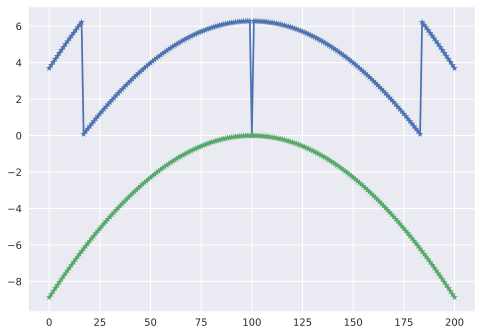

In [139]:
plt.plot(phase_delays, '-*')
plt.plot(phase_locals, '-*')

In [69]:
# # eps generator
# # generate the designed defocus region eps (index from 1.44 to 2.4) (eps from 1.44**2 to 2.4**2)
# max_height = 1
# phase_locals = []
# indexs = []
# design_paras = []
# for i in range(0, int(design_region_x / design_res) + 1, 1):
#     phase_local = (
#         2
#         * np.pi
#         / wvl
#         * (((i * design_res) ** 2 + focus_length**2) ** 0.5 - focus_length)
#     )
#     index = (phase_local / (2 * np.pi)) * wvl / max_height + 1
#     phase_locals.append(phase_local)
#     indexs.append(index)
#     # design_paras.append(design_para)

# for index in indexs:
#     design_paras.append((index - 1) / (max(indexs) - 1))
# max_material = mp.Medium(index=max(indexs))

Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.2738853503184713, 0.0>
Vector3<7.800298083741103e-17, 1.273885350318471

<Axes: xlabel='X', ylabel='Y'>

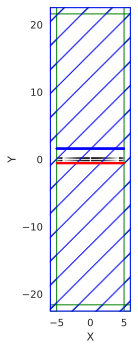

In [140]:
####################### Sources ##########################
# vertical source located at different position in x direction
sources = []
focus_lengths = []
phase_delays = []
for ii in range(
    -int(design_region_x / design_res), int(design_region_x / design_res), 1
):
    angle = 0
    rot_angle = angle
    k_point = mp.Vector3(fcen * 1).rotate(mp.Vector3(z=1), np.radians(90 - rot_angle))
    source_x =  + ii * (design_res) + design_res / 2
    sources.append(
        mp.EigenModeSource(
            src=mp.ContinuousSource(fcen, fwidth=fwidth, is_integrated=True),
            center=mp.Vector3(x=source_x, y=-max_height),
            size=mp.Vector3(x=design_res),
            direction=mp.NO_DIRECTION,
            eig_kpoint=k_point,
            eig_band=1,
            eig_parity=mp.ODD_Z,
            eig_match_freq=True,
        )
    )
    print(k_point)
    # the amplitude of source is e_field, the intensity is square of e_field
    # the line amplitude means quadratic intensity
    # sources[ii].amplitude = np.exp(1j * phase_delay) * (
    #     int(stop_angle / angle_resolution) - ii
    # )
    # sources[ii].amplitude = np.sqrt(int(design_region_x / design_res) - ii)

####################### Sources ##########################


####################### design_geometry ##########################
geometry = []
design_region_resolution_x = int(1 / design_res)
design_region_resolution_y = 1
Nx = int(2 * design_region_x * design_region_resolution_x)
Ny = 1

design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny), air, TiO2, grid_type="U_DEFAULT")
design_region = mpa.DesignRegion(
    design_variables,
    volume=mp.Volume(
        center=mp.Vector3(
            0,
            0,
            0,
        ),
        size=mp.Vector3(2 * design_region_x, max_height),
    ),
)
num_paras = Nx * Ny
design_region.update_design_parameters(np.array(design_paras[:num_paras]))
geometry.append(
    mp.Block(
        center=design_region.center,
        size=design_region.size,
        material=design_variables,
    )
)
####################### design_geometry ##########################
k = mp.Vector3()

sim = mp.Simulation(
    resolution=resolution,
    cell_size=cell,
    boundary_layers=[mp.PML(thickness=dpml)],
    sources=sources,
    geometry=geometry,
    k_point=k,
)

# ############### Monitor ###################
nfreq = 1


near_region = mp.FluxRegion(
    center=mp.Vector3(0, 0.5 * sy - dpml - 0.5 * near_field_height, 0),
    size=mp.Vector3(sx - 2 * dpml, 0),
)

near_field = sim.add_mode_monitor(
    fcen,
    fwidth,
    nfreq,
    near_region,
)

near_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=near_region.center, size=near_region.size
)

field_monitor = sim.add_dft_fields(
    [mp.Ez],
    fcen,
    fwidth,
    nfreq,
    center=mp.Vector3(),
    size=mp.Vector3(sx, sy),
)
# near2far_field
n2f_field = sim.add_near2far(
    fcen,
    0,
    nfreq,
    near_region,
)

# geometry plot
sim.plot2D()

FloatProgress(value=0.0, description='0% done ')

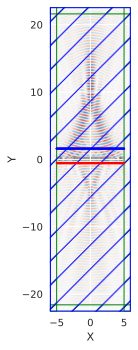

In [141]:
mpt = mp.Vector3(0, 0.5 * sy - dpml - 0.5 * near_field_height, 0)

f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

# sim.run(
#     mp.at_every(1, Animate),
#     until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, mpt, 1e-5),
# )
sim.run(
    mp.at_every(1, Animate),
    until=100,
)

In [ ]:
amplitudes = []
for source in sources:
    amplitudes.append(source.amplitude)
plt.bar(
    range(0, int(design_region_x / design_res) + 1, 1),
    np.power(np.abs(np.array(amplitudes)), 2),
    width=0.3,
)
plt.plot(
    range(0, int(design_region_x / design_res) + 1, 1),
    np.power(np.abs(np.array(amplitudes)), 2),
    linewidth=3,
)

In [142]:
Animate.to_jshtml(fps=1)

**DFT field** 

755.7379790986721


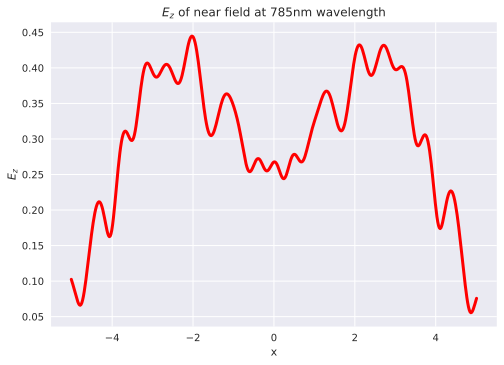

In [143]:
output_dft = sim.get_dft_array(near_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=near_dft) # type: ignore
# normalize the output_dft
figure, ax = plt.subplots()
total_power = np.sum(np.abs(output_dft) ** 2 * (x[1] - x[0]))
print(total_power)
norm_output_dft = output_dft / np.sqrt(total_power)
# plt.plot(x, np.real(norm_output_dft), "-b")
# plt.plot(x, np.imag(norm_output_dft), "--r")
plt.plot(x, np.abs(norm_output_dft), "-r", linewidth=3)
plt.title(r"$ E_z $ of near field at 785nm wavelength")
ax.set_xlabel("x")
ax.set_ylabel(r"$ E_z $")
np.save(save_path + "near_field.npy", norm_output_dft)

In [10]:
# obj = max(sum(E*conj(E)))
# print(np.abs(np.sum(norm_output_dft * np.conj(norm_output_dft))))

In [52]:
print(np.sum(np.abs(norm_output_dft)**2*(x[1]-x[0])))

0.9999999999999999


In [12]:
# input_mode = sim.get_eigenmode_coefficients(
#     near_field, list(range(1, 26, 1)), eig_parity=mp.EVEN_Y + mp.ODD_Z
# )
# input_mode_coe = np.squeeze(input_mode.alpha)
# input_flux = mp.get_fluxes(near_field)
# print(f"根据eigenmode_coe[0]计算得到的flux: {abs(input_mode_coe[0]) ** 2}")
# print(f"根据flux计算得到的flux: {input_flux}")
# print(f'逆向eigenmode_coe[0]: {abs(input_mode_coe[1]) ** 2}')
# print(f"逆向eigenmode_coe[1]: {abs(input_mode_coe[1]) ** 2}")

The angle of maximum intensity is 0.0


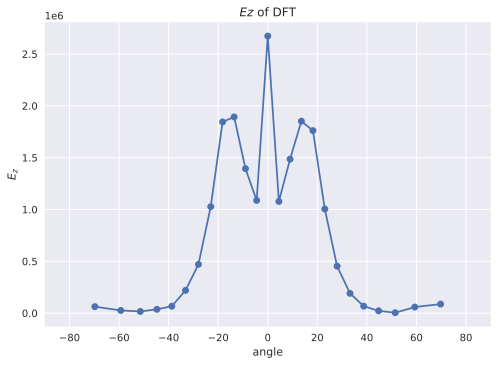

In [144]:
# dft ot near field
kx = np.fft.fftshift(np.fft.fftfreq(len(x), grid))
near_field_fft = np.fft.fftshift(np.fft.fft(output_dft))

k = 1 / wvl
kx[np.abs(kx) > k] = np.nan
angle = np.arcsin(kx / k) * 180 / np.pi

figure, ax = plt.subplots()
plt.plot(angle, np.abs(near_field_fft) ** 2, "-o")
# plt.scatter(angle, near_field_fft)
plt.title(r"$ Ez $ of DFT")
ax.set_xlabel("angle")
ax.set_ylabel(r"$ E_z $")
ax.set_xlim(-90, 90)

max_index = np.argmax(np.abs(near_field_fft) ** 2)
print(f"The angle of maximum intensity is {angle[max_index]}")


source.amplitude is 1, flux is 15.4

In [145]:
am = 1 / mp.GaussianSource(fcen, fwidth=fwidth).fourier_transform(fcen)
print(np.abs(am))
print((1 / np.abs(am)) ** 2)  


0.025477707006369428
1540.5625


**Field monitor**

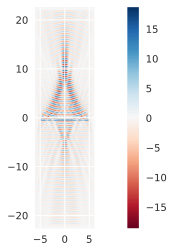

In [160]:
field_data = sim.get_dft_array(field_monitor, mp.Ez, 0)
field_eps = sim.get_array(
    component=mp.Permeability, center=mp.Vector3(), size=mp.Vector3(sx, sy)
)
[x, y, z, w] = sim.get_array_metadata(dft_cell=field_monitor)
x_grid, y_grid = np.meshgrid(x, y)
plt.figure(figsize=(12, 4))
# plt.pcolormesh(x_grid, y_grid, field_eps.transpose(), cmap="binary")
field_data = np.flipud(field_data.transpose())
# plt.imshow(np.angle(field_data[:][0:100])* np.abs(field_data[:][0:100]), cmap="RdBu")
# plot x and y axis
#
plt.imshow(np.real(field_data[:]), cmap="RdBu", extent=[x[0], x[-1], y[0], y[-1]])
# plt.imshow(np.abs(field_data[:]), cmap="RdBu")
# plt.xticks([src_region.center.x, out_region.center.x])
# plt.yticks([0.5])
plt.colorbar()

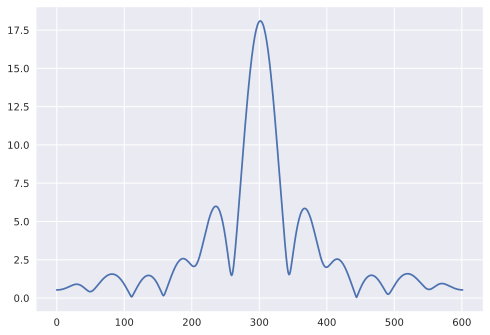

In [130]:
line=100
# plt.plot(np.real(field_data[:][line]))
# plt.plot(np.imag(field_data[:][line]))
plt.plot(np.abs(field_data[:][line]))

**far field**

Output_angle of grating coupler: 0.09933844017830203 degree
max of far field: 14.865800839882853


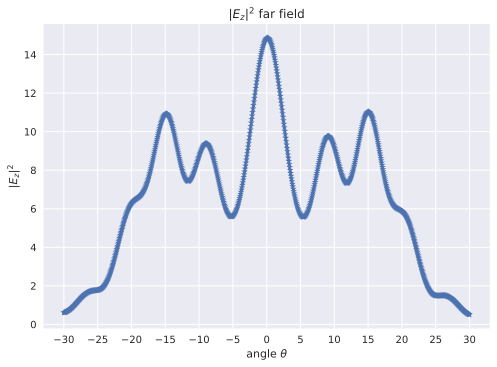

In [173]:
# 远场均匀分布
ff_distance = 1e2  # far-field distance from near-field monitor
ff_angle = 30  # far-field cone angle
ff_npts = 1000  # number of far-field points
# single-side far-field length
ff_length = ff_distance * math.tan(math.radians(ff_angle))  # far-field length
# [-ff_length, ff_length]
ff_lengths = np.linspace(-ff_length, ff_length, ff_npts)  # far-field lengths
# resolution
ff_res = ff_npts / (2 * ff_length)  # far-field length resolution

ff = sim.get_farfields(
    n2f_field,
    ff_res,
    center=mp.Vector3(0, ff_distance),
    size=mp.Vector3(x=2 * ff_length),
)
# [-angle, angle]
angles = [math.degrees(math.atan(f)) for f in ff_lengths / ff_distance]
rel_enh = np.abs(ff["Ez"]) ** 2

figure, ax = plt.subplots()
plt.plot(angles, rel_enh, "-*")
plt.title(r"$ {|E_z|}^2 $ far field")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ {|E_z|}^2 $")
ax.set_xticks(range(-30, 35, 5))
index = np.argmax(rel_enh)
print(f"Output_angle of grating coupler: {angles[index]} degree")
print(f"max of far field: {np.max(rel_enh)}")

计算总场power

In [18]:
total_power = mp.get_fluxes(near_field)
print(total_power)

[7496.111998838819]


Text(0, 0.5, '$ |{E_z}|^2 $')

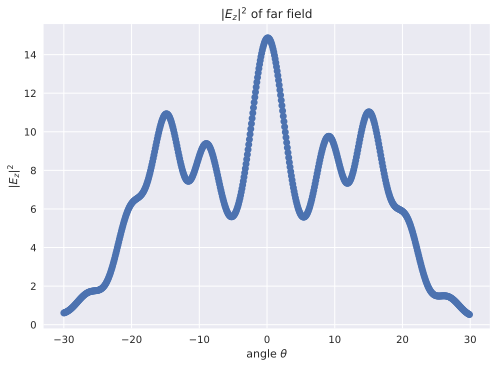

In [177]:
# 验证在0-25度光源传播下，monitor的远场角度分布
# 设置角度的分辨率为 0.2degree
d_angle = 0.1
ff_distance = 1e2
ff_angle = 89
ff_number = int(2 / d_angle) * ff_angle + 1
ff_angles = np.linspace(-ff_angle, ff_angle, ff_number)
ff_points = [
    mp.Vector3(fx, ff_distance, 0) for fx in np.tan(np.radians(ff_angles)) * ff_distance
]

ob_list = [sim.get_farfield(n2f_field, ff_point) for ff_point in ff_points]
n2f_angle_Ez = [Ez[2] for Ez in ob_list]
rel_enh = np.abs(n2f_angle_Ez) ** 2
# figure, ax = plt.subplots()
# plt.plot(ff_angles, rel_enh, "-*")
# plt.title(r"$ {|Ez|}^2 $ far field")
# ax.set_xlabel(r"angle $ \theta$")
# ax.set_ylabel(r"$ {|E_z|}^2 $")

plot_angle = 30  # 绘制的角度范围
figure, ax = plt.subplots()
angle_minlim = np.where(ff_angles == -plot_angle)[0][0]
angle_maxlim = np.where(ff_angles == plot_angle)[0][0]
plt.plot(ff_angles[angle_minlim:angle_maxlim], rel_enh[angle_minlim:angle_maxlim], "-o")
plt.title(r"$ |{E_z}|^2 $ of far field")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ |{E_z}|^2 $")
# plt.xticks([-16, -15])

array([-89. , -88.9, -88.8, ...,  88.8,  88.9,  89. ])

**验证far field计算得到的power与mp.get_fluxes()相等**

In [21]:
d_length = []
for angle in ff_angles:
    # The length of each angle in the far field
    length = ff_distance / np.cos(np.radians(angle))
    d_length.append(np.radians(d_angle) * length)

print(f"The total length {np.sum(d_length)} um calculated by angles")

energy = 0
for ii in range(0, ff_number, 1):
    energy = energy + d_length[ii] * (np.abs(n2f_angle_Ez[ii]) ** 2)
print(f"The power of near_field is {energy}")

near_field_flux = mp.get_fluxes(near_field)
print(f"The power of near_field is {near_field_flux[0]}")

The total length 9584367.521096503 um calculated by angles
The power of near_field is 7520.320400982555
The power of near_field is 7496.111998838819


**Normalized power: 1**

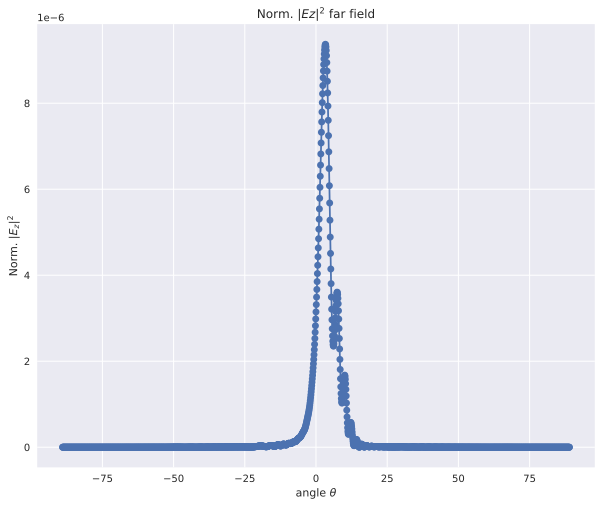

In [22]:
norm_rel = rel_enh / energy
figure, ax = plt.subplots(figsize=(10, 8))
plt.plot(ff_angles, norm_rel, "-o")
plt.title(r"Norm. $ {|Ez|}^2 $ far field")
ax.set_xlabel(r"angle $ \theta$")
ax.set_ylabel(r"Norm. $ {|E_z|}^2 $")
np.save(save_path + "far_field.npy", norm_rel)


In [23]:
norm_rel.shape

(1781,)

**验证归一化之后的enegy is 1**

In [24]:
norm_energy = 0
for ii in range(0, ff_number, 1):
    norm_energy = norm_energy + d_length[ii] * (norm_rel[ii])
print(f"The power of near_field is {norm_energy}")


The power of near_field is 0.9999999999999979


In [25]:
# norm_rel_load = np.load('norm_rel.npy')
# figure= plt.figure(figsize=(10, 10))
# plt.plot(ff_angles, norm_rel_load, "-o")


# forward (-25-0度)

当光栅周期较小时，会出现光栅的矢量大于波导的传播常数，会使得出射光束在负方向，因此考虑到最下化grating coupler的尺寸，尝试在负方向 (**-25-0度**) 远场分布


<Axes: xlabel='X', ylabel='Y'>

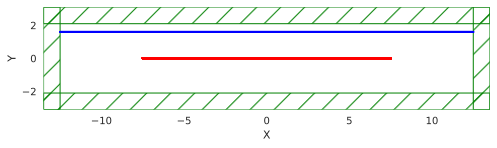

In [26]:
# if True compute flux (Gaussian source), if False compute DFT (Continue source)
compute_flux = True
# size of input and output waveguide
w = 0.5
h = 0.2

# resolution size
grid = 0.02
resolution = 1 / grid

# thickness of PML
dpml = 1

##################### length parameter ################
source_height = 0.5  # 与逆向设计中的meta_grarting区域保持一致
input_wvg_length = 5
output_wvg_length = 5
design_region_x = 15
design_region_y = 0.2
sx = input_wvg_length + design_region_x + output_wvg_length + 2 * dpml

##################### height parameter ################
Substrate_thickness = 0.5
BOX_thickness = 2
TOX_thickness = 0.7
near_field_height = 1
sy = BOX_thickness + TOX_thickness + Substrate_thickness + near_field_height + 2 * dpml

cell = mp.Vector3(sx, sy, 0)

# Material setting
Si = mp.Medium(index=3.45)
SiO2 = mp.Medium(index=1.44)
SiN = mp.Medium(index=1.96)


####################### Sources ##########################
wvl = 0.785
fcen = 1 / wvl
fwidth = 0.2 * fcen

start_angle = 0
stop_angle = 25
sources = []
angle_resolution = 0.1
for ii in range(0, int(stop_angle / angle_resolution) + 1, 1):
    angle = ii * angle_resolution
    rot_angle = angle
    # 修改 k_point 角度从(0, 25) -> (0, -25)
    k_point = mp.Vector3(fcen * 1).rotate(mp.Vector3(z=1), np.radians(90 + rot_angle))
    sources.append(
        mp.EigenModeSource(
            src=mp.GaussianSource(fcen, fwidth=fwidth),
            center=mp.Vector3(y=0),
            size=mp.Vector3(x=design_region_x),
            direction=mp.NO_DIRECTION,
            eig_kpoint=k_point,
            eig_band=1,
            eig_parity=mp.ODD_Z,
            eig_match_freq=True,
        )
    )
    # the amplitude of source is e_field, the intensity is square of e_field
    sources[ii].amplitude = np.sqrt(int(stop_angle / angle_resolution) - ii)

# angle = 5
# rot_angle = angle
# k_point = mp.Vector3(fcen * 1).rotate(mp.Vector3(z=1), np.radians(90 - rot_angle))
# sources.append(
#     mp.EigenModeSource(
#         src=mp.GaussianSource(fcen, fwidth=fwidth),
#         center=mp.Vector3(y=0),
#         size=mp.Vector3(x=sx - 2 * dpml),
#         direction=mp.NO_DIRECTION,
#         eig_kpoint=k_point,
#         eig_band=1,
#         eig_parity=mp.ODD_Z,
#         eig_match_freq=True,
#     )
# )
# sources[0].amplitude = 2

# set nomrlized source: amplitude is 1 -> flux is 1
# sources[0].amplitude = 1 / mp.GaussianSource(fcen, fwidth=fwidth).fourier_transform(
#     fcen
# )

####################### Sources ##########################

sim = mp.Simulation(
    resolution=resolution,
    cell_size=cell,
    boundary_layers=[mp.PML(dpml)],
    sources=sources,
)

# ############### Monitor ###################
nfreq = 1


near_region = mp.FluxRegion(
    center=mp.Vector3(0, 0.5 * sy - dpml - 0.5 * near_field_height, 0),
    size=mp.Vector3(sx - 2 * dpml, 0),
)

near_field = sim.add_mode_monitor(
    fcen,
    fwidth,
    nfreq,
    near_region,
)

near_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=near_region.center, size=near_region.size
)

# near2far_field
n2f_field = sim.add_near2far(
    fcen,
    0,
    nfreq,
    near_region,
)

# geometry plot
sim.plot2D()

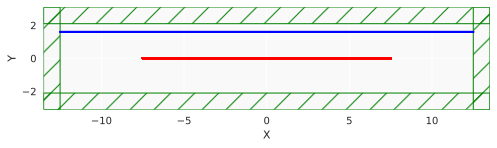

In [27]:
mpt = mp.Vector3(0, 0.5 * sy - dpml - 0.5 * near_field_height, 0)

f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

sim.run(
    mp.at_every(1, Animate),
    until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, mpt, 1e-5),
)

In [28]:
filename = "base_simulation_angle_source.mp4"
Animate.to_mp4(10, filename)

from IPython.core.display import Video

Video(filename)

14518329.293731548


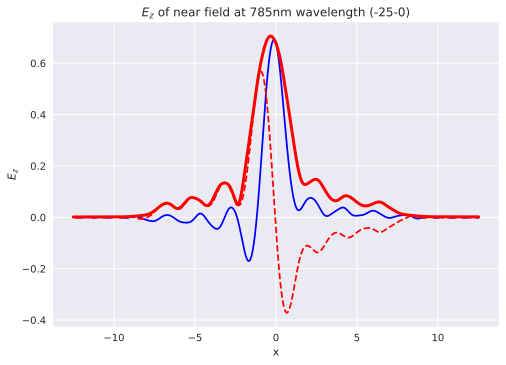

In [29]:
output_dft = sim.get_dft_array(near_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=near_dft)  # type: ignore
figure, ax = plt.subplots()
total_power = np.sum(np.abs(output_dft) ** 2 * (x[1] - x[0]))
print(total_power)
norm_output_dft = output_dft / np.sqrt(total_power)
plt.plot(x, np.real(norm_output_dft), "-b")
plt.plot(x, np.imag(norm_output_dft), "--r")
plt.plot(x, np.abs(norm_output_dft), "-r", linewidth=3)
plt.title(r"$ E_z $ of near field at 785nm wavelength (-25-0)")
ax.set_xlabel("x")
ax.set_ylabel(r"$ E_z $")
np.save("near_field.npy", norm_output_dft)

In [30]:
print(np.abs(np.sum(norm_output_dft * np.conj(norm_output_dft))))

50.00000000000106


Output_angle of grating coupler: -2.7462612353703135 degree
max of far field: 8.439743069992755


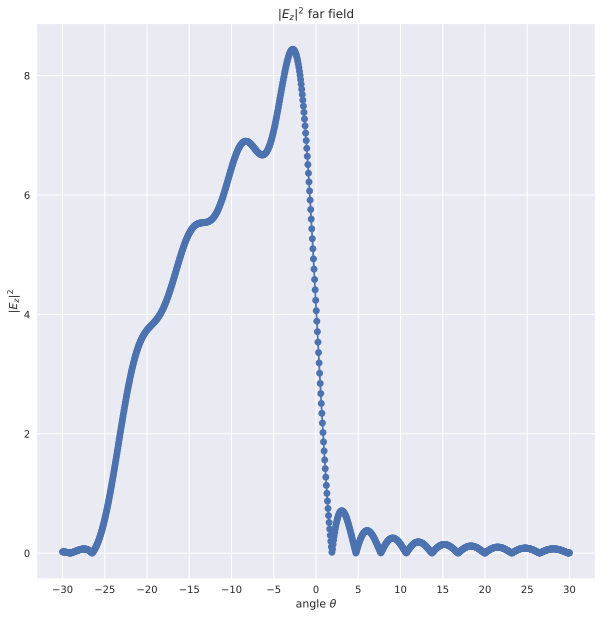

In [31]:
ff_distance = 1e6  # far-field distance from near-field monitor
ff_angle = 30  # far-field cone angle
ff_npts = 1000  # number of far-field points
# single-side far-field length
ff_length = ff_distance * math.tan(math.radians(ff_angle))  # far-field length
# [-ff_length, ff_length]
ff_lengths = np.linspace(-ff_length, ff_length, ff_npts)  # far-field lengths
# resolution
ff_res = ff_npts / (2 * ff_length)  # far-field length resolution

ff = sim.get_farfields(
    n2f_field,
    ff_res,
    center=mp.Vector3(0, ff_distance),
    size=mp.Vector3(x=2 * ff_length),
)
# [-angle, angle]
angles = [math.degrees(math.atan(f)) for f in ff_lengths / ff_distance]
rel_enh = np.abs(ff["Ez"])

figure, ax = plt.subplots(figsize=(10, 10))
plt.plot(angles, rel_enh, "-o")
plt.title(r"$ {|E_z|}^2 $ far field")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ {|E_z|}^2 $")
ax.set_xticks(range(-30, 35, 5))
index = np.argmax(rel_enh)
print(f"Output_angle of grating coupler: {angles[index]} degree")
print(f"max of far field: {np.max(rel_enh)}")